# Test the hologram performances with HD205905 data 30 may 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : October 2nd th 2017
- update : October 6th 2017


The goal of this notebook is to find the parameters that optimize the1-D spectrum for the 2-D image of the disperse
spectrum.
In particular the width around the dispersion axis is very important. This width may bias the computation of equavalent width.
Moreover, we check in this notebook that the wavelength calibration make sense, ie, the position of the order 0 central star in the original image is correct, allowing wavelength calibration





#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 Ana2DShapeSpectra.ipynb

So it behaves better

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Ana2DShapeSpectra
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/ana_30may17/HD205905


In [5]:
from astropy.modeling import models, fitting

In [6]:
import pandas as pd

# Input directory

In [7]:
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=208
MAX_IMGNUMBER=284
date="20170530"
object_name='HD205905'
tag = "rotimg"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

# Output directory

In [8]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

# Open files
===================================

## order 0 position in original image

In [9]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [10]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [11]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.687854,777.817052,697.213424
1,1,-0.698755,778.828008,699.389248
2,2,-0.967711,778.262882,698.021874
3,3,-1.901504,779.394803,697.262388
4,4,-1.508646,778.822621,697.404092


## order 0 position in rotated and cut image

In [12]:
df2=pd.read_csv('x_y_guess2.csv')
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]
order0_positions2 = np.array([x_star2,y_star2]).T

In [13]:
df2.head()

,Unnamed: 0,theta,x_guess2,y_guess2
0,0,-0.687854,778.843565,109.762935
1,1,-0.698755,779.889708,109.911530
2,2,-0.967711,779.820360,113.275892
3,3,-1.901504,782.513463,126.080753
4,4,-1.508646,781.477620,120.969250


## Input image files

- rotated and cut images

In [14]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)
print all_images[0].shape

Number of images: 75
(100, 2048)


In [15]:
print all_filt

['dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron400

## Check calib info on holograms and disperser

In [16]:
all_grat = []
all_holo = []
for f in all_filt :
    #all_grat.append(f.replace('RG715 ',''))
    all_grat.append(f.replace('dia ',''))
for index,g in enumerate(all_grat):
    holo = Hologram(g,verbose=False)
    #all_holo.append[holo]
    print 'holo_name=',g,'holo_theta=',holo.theta(order0_positions[index]),' rot_theta',all_theta[index],'order0_positions', order0_positions[index]

holo_name= Ron400 holo_theta= -0.277  rot_theta -0.687853803054 order0_positions [ 777.81705164  697.21342393]
holo_name= Thor300 holo_theta= -0.575  rot_theta -0.698754568993 order0_positions [ 778.82800845  699.38924782]
holo_name= HoloPhP holo_theta= [-0.93769755]  rot_theta -0.967711293477 order0_positions [ 778.26288247  698.02187365]
holo_name= HoloPhAg holo_theta= [-1.52399032]  rot_theta -1.9015039876 order0_positions [ 779.39480316  697.2623876 ]
holo_name= HoloAmAg holo_theta= [-1.54910966]  rot_theta -1.50864644948 order0_positions [ 778.8226214   697.40409152]
holo_name= Ron400 holo_theta= -0.277  rot_theta -0.622673914504 order0_positions [ 778.34328085  697.68169365]
holo_name= Thor300 holo_theta= -0.575  rot_theta -0.677618395769 order0_positions [ 778.00488188  699.08234706]
holo_name= HoloPhP holo_theta= [-0.93906691]  rot_theta -0.948875960081 order0_positions [ 778.6726721   697.08807346]
holo_name= HoloPhAg holo_theta= [-1.52676425]  rot_theta -1.92609055165 order0_

holo_name= Thor300 holo_theta= -0.575  rot_theta -0.862326432589 order0_positions [ 751.64900719  675.02406964]
holo_name= HoloPhP holo_theta= [-0.93450851]  rot_theta -0.984474891553 order0_positions [ 751.07268029  672.55450982]
holo_name= HoloPhAg holo_theta= [-1.56552797]  rot_theta -1.98194003138 order0_positions [ 750.35145841  671.17721527]
holo_name= HoloAmAg holo_theta= [-1.62081279]  rot_theta -1.64864337231 order0_positions [ 748.52059663  672.03906632]


## Show filters and dispersers

In [17]:
Filt_names

['dia Ron400',
 'dia Thor300',
 'dia HoloPhP',
 'dia HoloPhAg',
 'dia HoloAmAg',
 'dia Ron200',
 'Unknown']

In [18]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [19]:
print Filt_names[0],filt0_idx
print Filt_names[1],filt1_idx
print Filt_names[2],filt2_idx
print Filt_names[3],filt3_idx
print Filt_names[4],filt4_idx
print Filt_names[5],filt5_idx
print Filt_names[6],filt6_idx

dia Ron400 [ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70]
dia Thor300 [ 1  6 11 16 21 26 31 36 41 46 51 56 61 66 71]
dia HoloPhP [ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72]
dia HoloPhAg [ 3  8 13 18 23 28 33 38 43 48 53 58 63 68 73]
dia HoloAmAg [ 4  9 14 19 24 29 34 39 44 49 54 59 64 69 74]
dia Ron200 []
Unknown []


# Input images


Notice, we expect the spectrum is centered in vertical.
The central star is at the origin in the raw image

## Full rotated image

In [20]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


## Center of central star

Obviously the previous estimation of the center is wrong

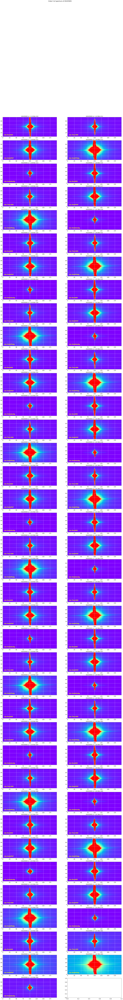

In [21]:
# Center : Order 0
#-------------------
# start at star
y_star0=[all_images[0].shape[0]/2]*len(all_images)
x_star0=x_star2
#ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
#                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0,y_star0,[100]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

title='Order 0 of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'order0.pdf')
plt.savefig(figfilename)  

### check weighted_avg_and_std is a good estimator of the central position

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


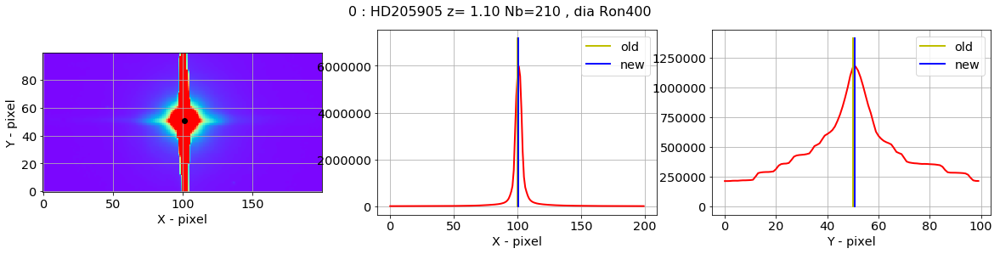

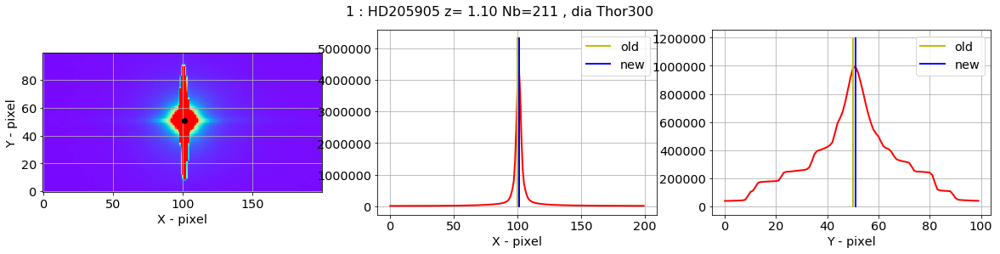

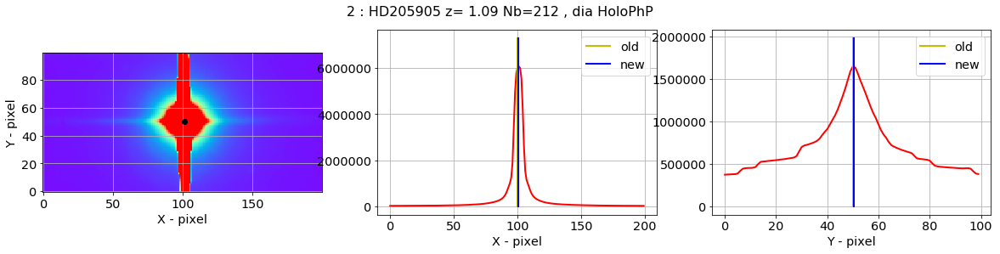

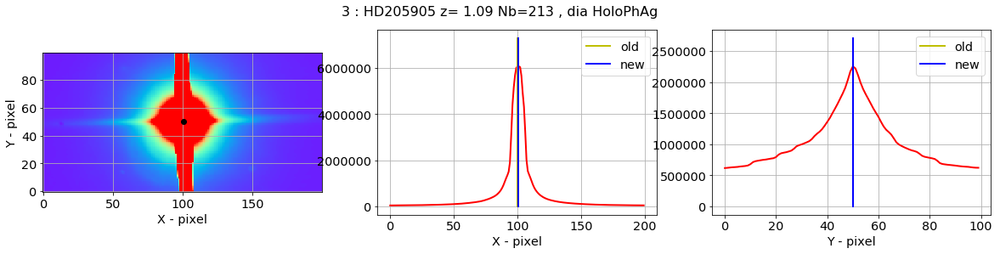

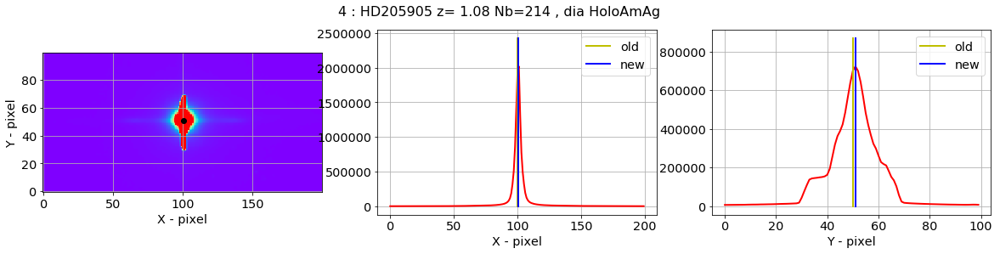

...

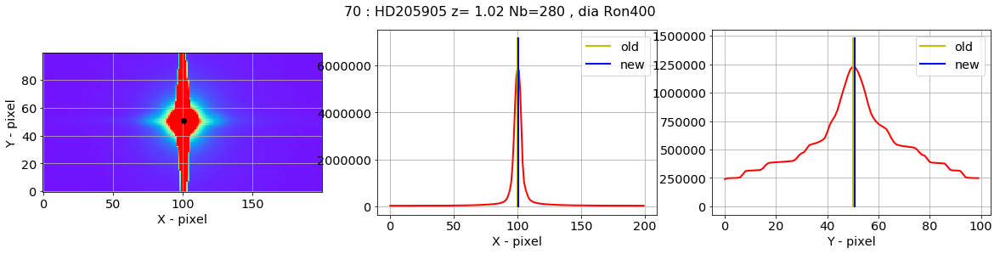

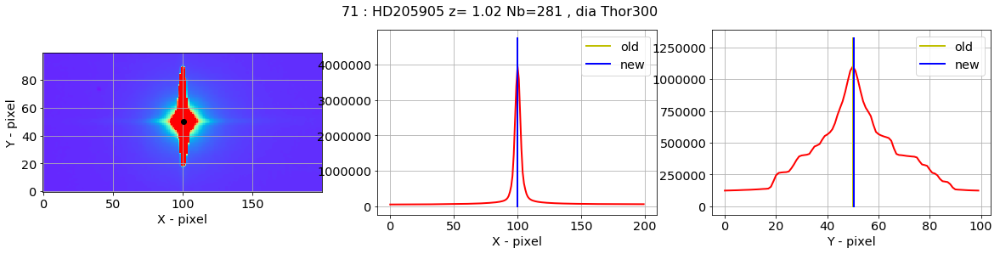

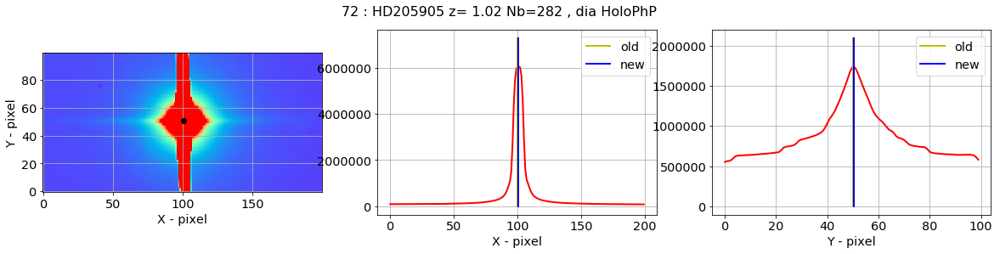

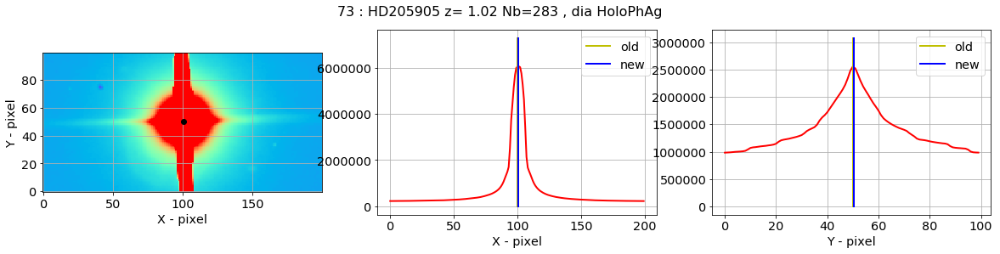

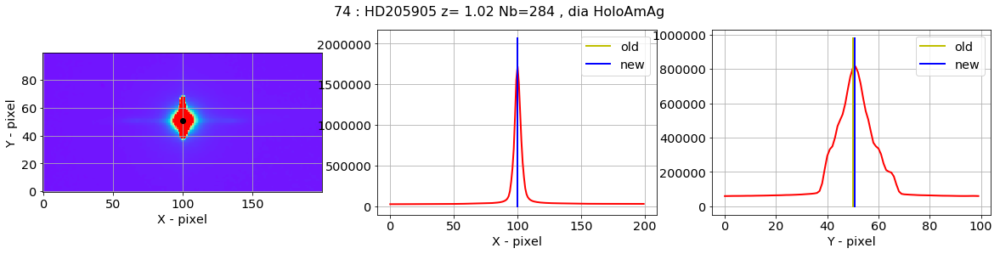

In [22]:
new_x_star,new_y_star=check_central_star(all_images,x_star2,y_star0,all_titles,all_filt)

## Zoom on the rotated image

In [23]:
# Right spectrum
#---------------
# start at star
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star

y_star0=new_y_star
x_star0=new_x_star
#ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
#                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0+400,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([new_x_star,new_y_star]).T)

title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [24]:
# Left spectrum
#--------------
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star-600

y_star0=new_y_star
x_star0=new_x_star

#ShowCenterImages([110]*len(all_images),[60]*len(all_images),[500]*len(all_images),[30]*len(all_images),
#                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0-600,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([new_x_star,new_y_star]).T)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



# Main emission/absorption lines in nm


In [25]:
for line in LINES:
    print line['label'],' \t lambda =' ,line['lambda']

$H\delta$  	 lambda = 410.2
$H\gamma$  	 lambda = 434.0
$He_{II}$  	 lambda = 468.6
$H\beta$  	 lambda = 486.3
$O_{III}$  	 lambda = 500.7
$C_{III}$  	 lambda = 570.0
$He_{I}$  	 lambda = 587.5
$H\alpha$  	 lambda = 656.3
$C_{III}$  	 lambda = 673.0
$C_{II}$  	 lambda = 679.0
$C_{IV}$  	 lambda = 706.0
$C_{II}$  	 lambda = 711.0
$C_{II}$  	 lambda = 723.5
$O_2$  	 lambda = 762.1
$H_2 O$  	 lambda = 960


# Plot one contour

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


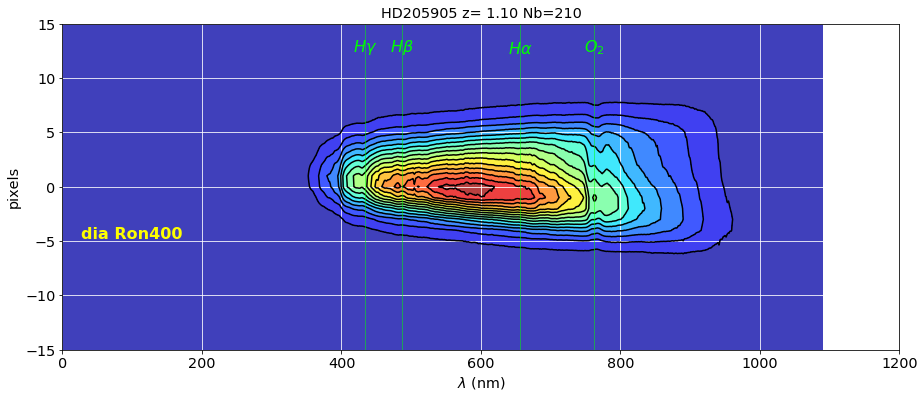

In [64]:
sel=0
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_ron400_1.pdf')

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


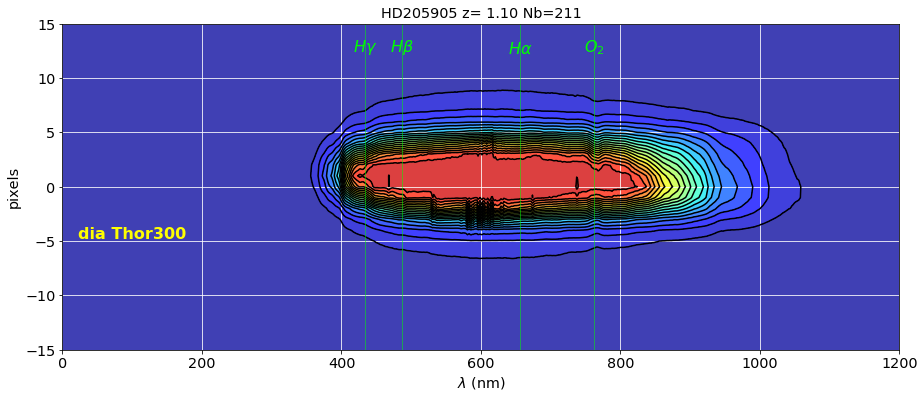

In [65]:
sel=1
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_thor300_1.pdf')

Load hologram HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.0 degrees
Hologram center at x0 = 856.0 and y0 = 562.3 with average tilt of -1.0 degrees
Order  0 position at x0 = 590.7 and y0 = 567.2
Order +1 position at x0 = 1121.3 and y0 = 557.5
Distance between the orders: 530.76 pixels (12.74 mm)


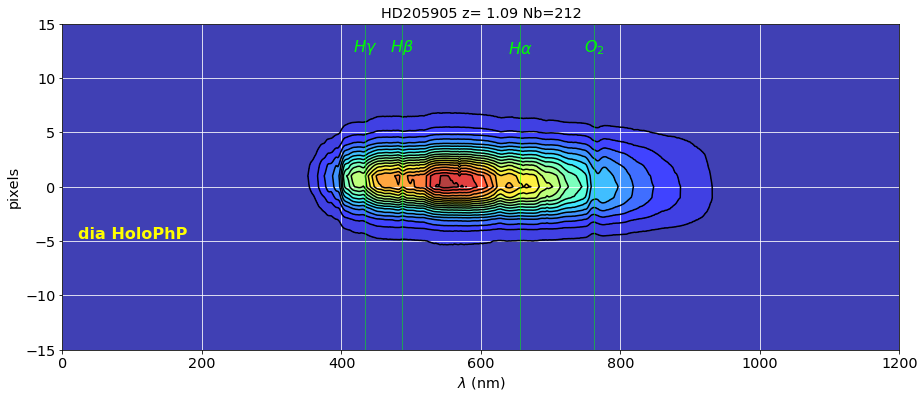

In [69]:
sel=2
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_holophp_1.pdf')

Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)


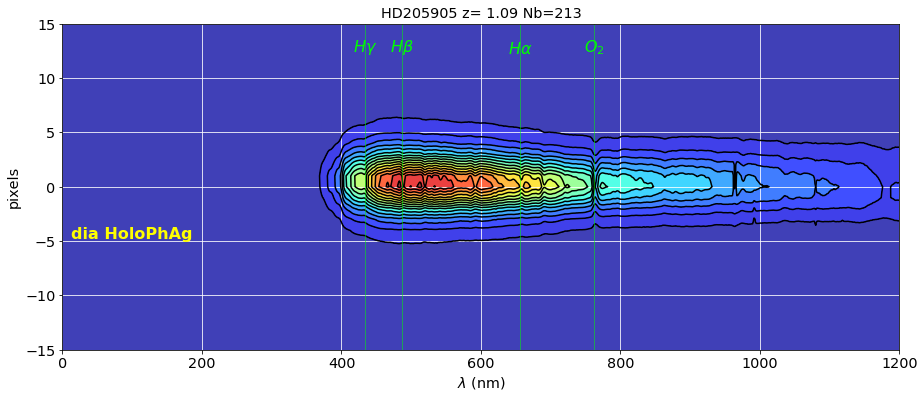

In [68]:
sel=3
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_holophag_1.pdf')

Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)


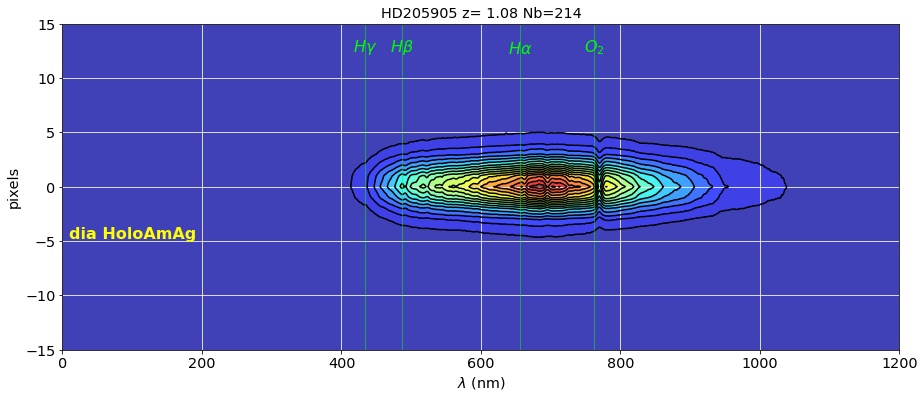

In [70]:
sel=4
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_holoamag_1.pdf')

pdf Page written  1


/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


pdf Page written  2
pdf Page written  3
pdf Page written  4
pdf Page written  5
pdf Page written  6
pdf Page written  7
Final pdf Page written  7


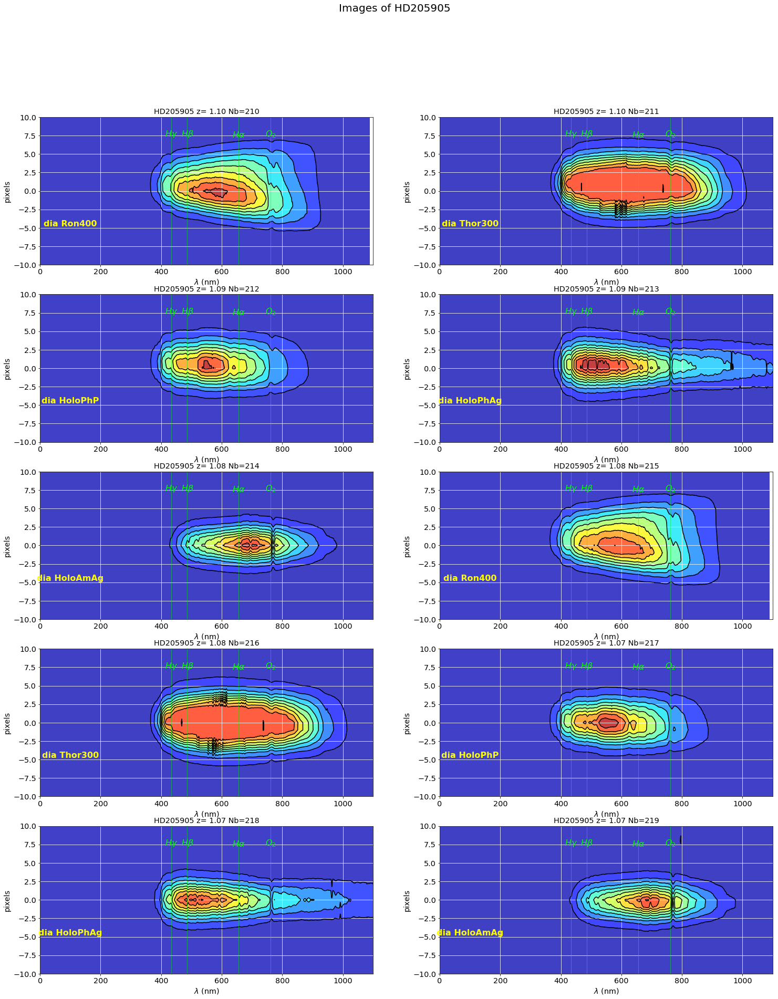

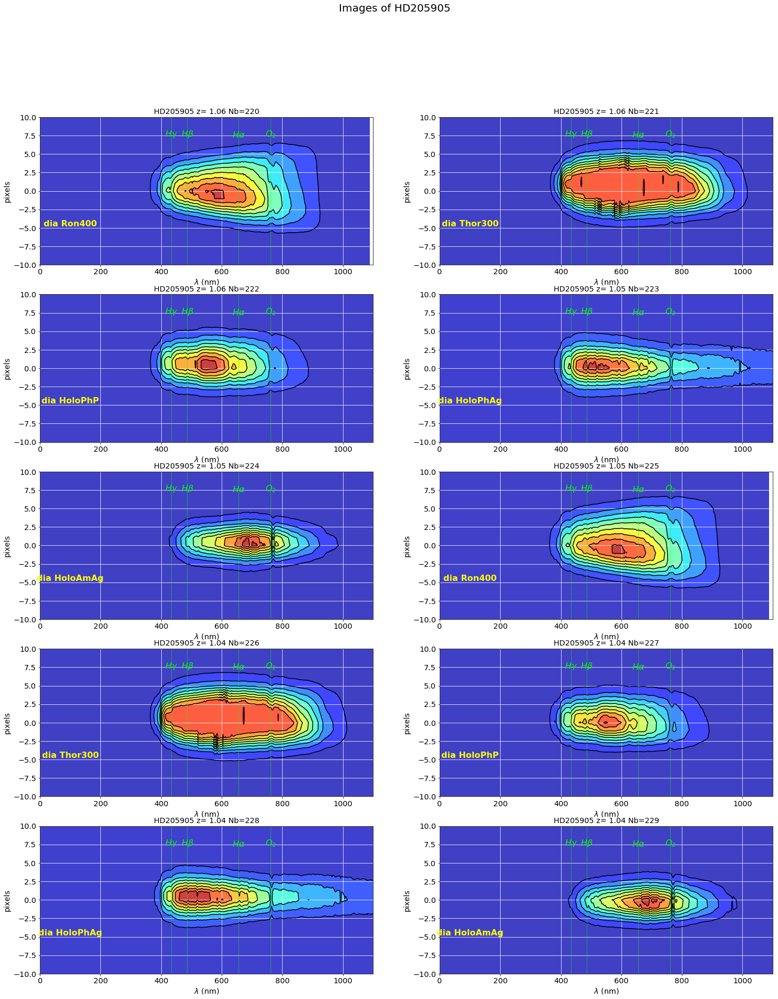

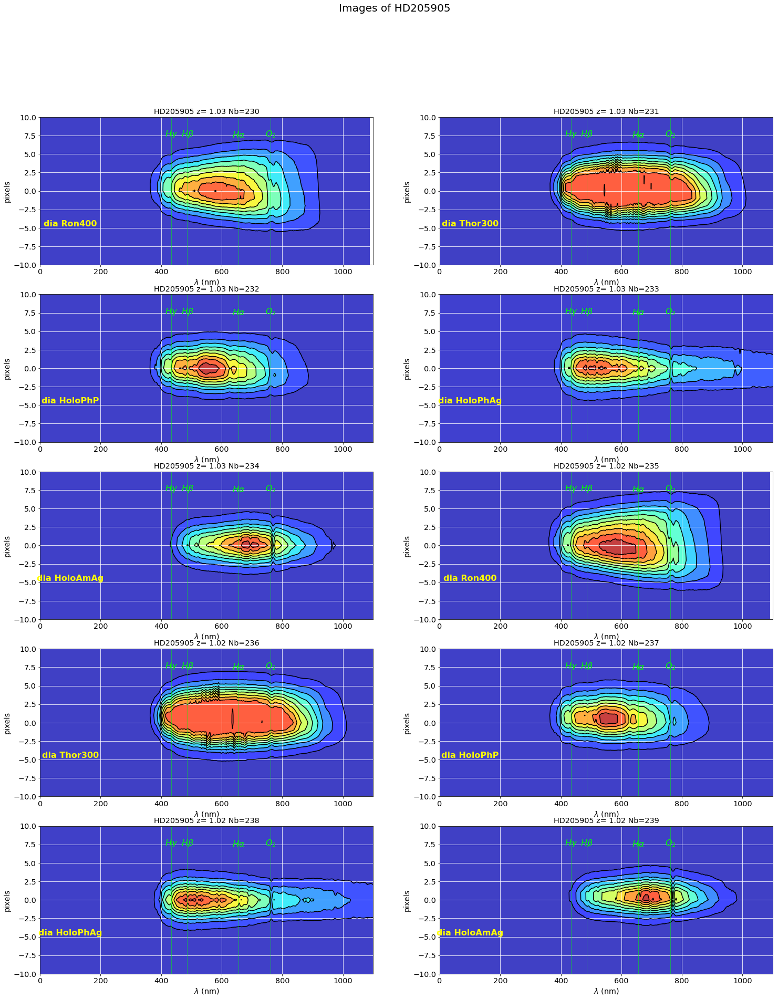

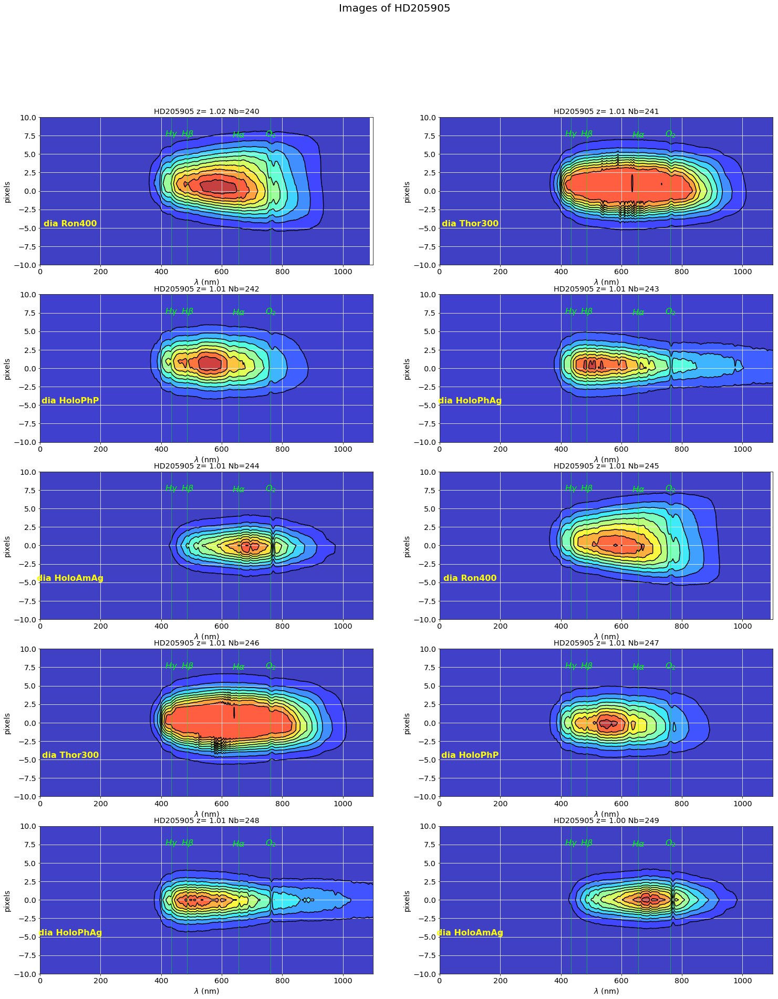

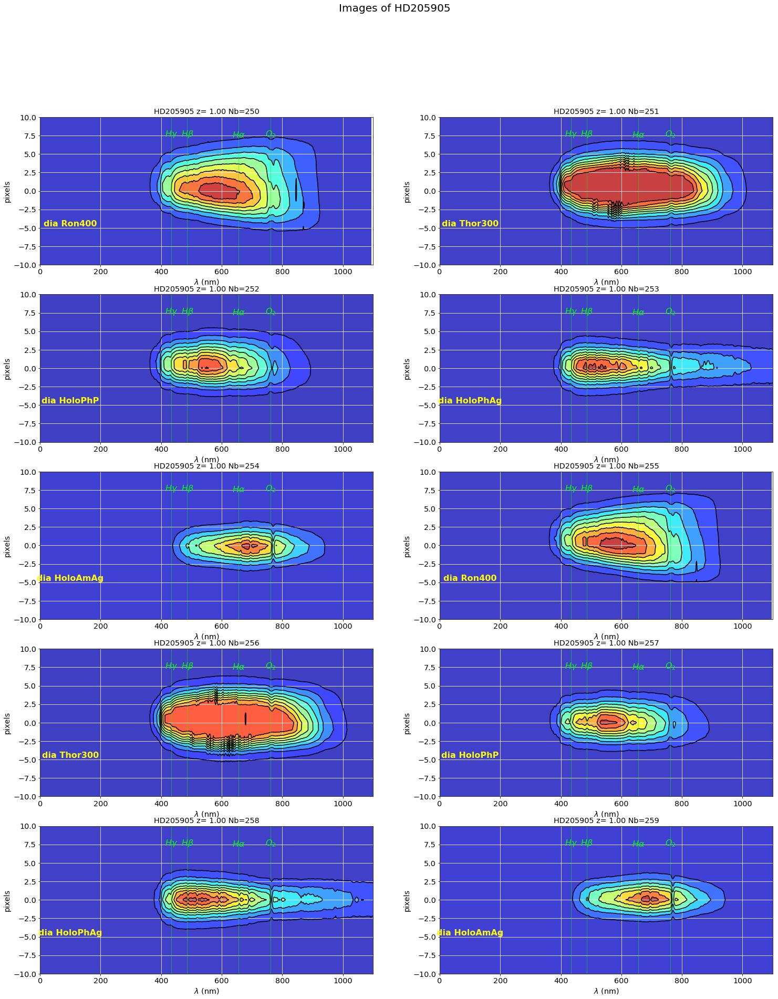

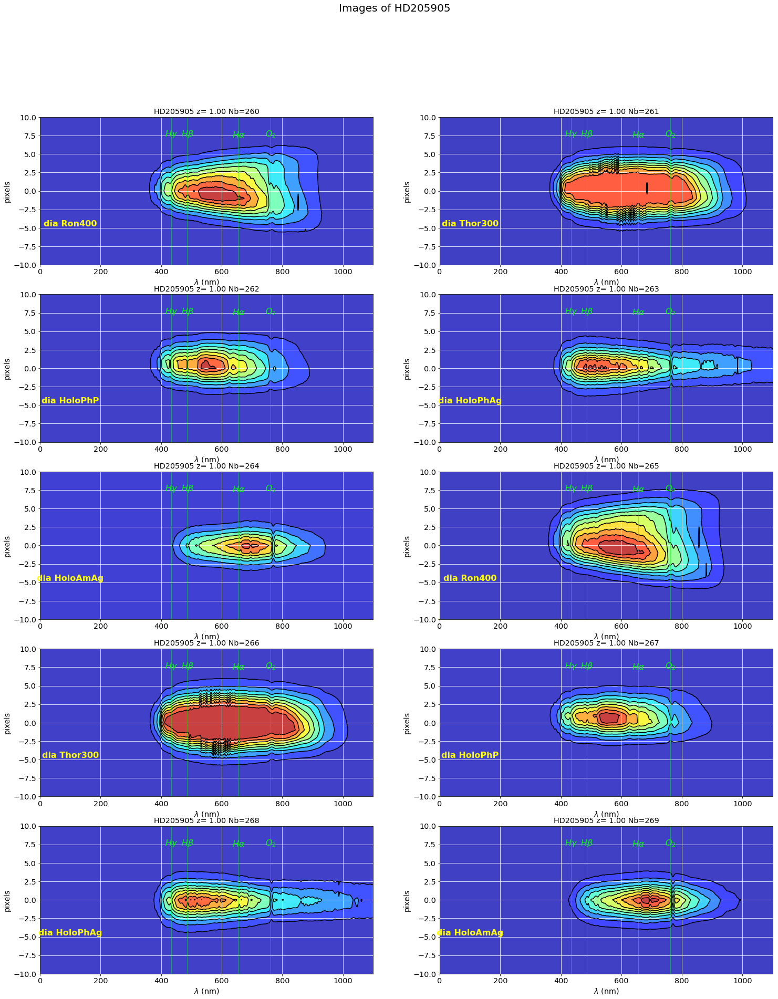

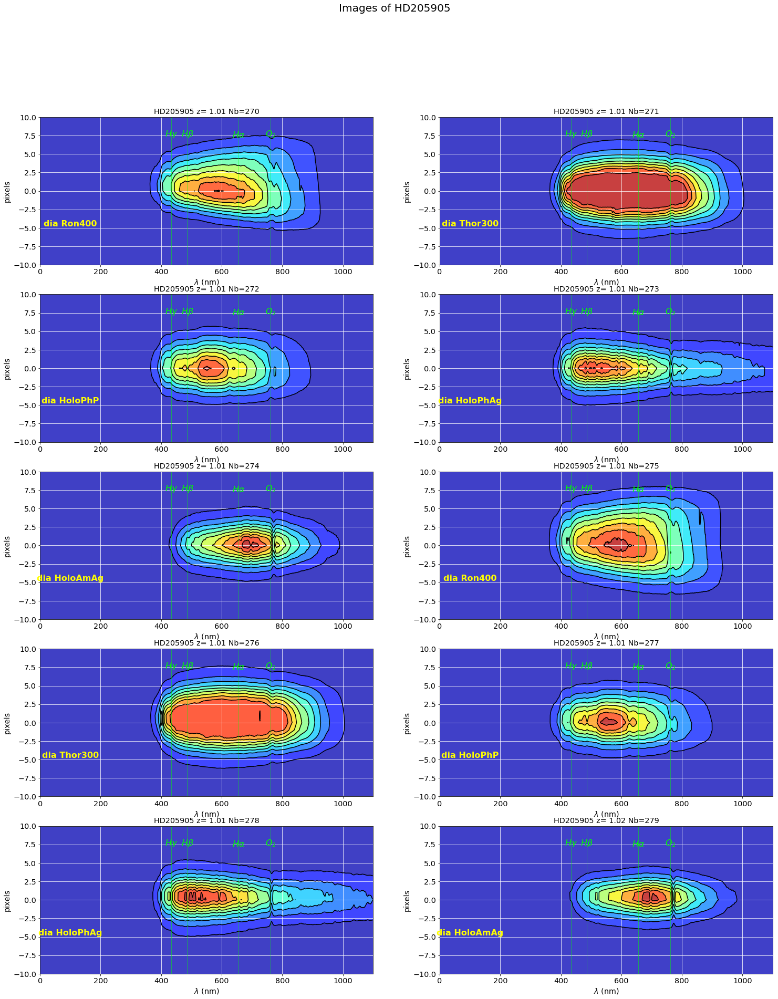

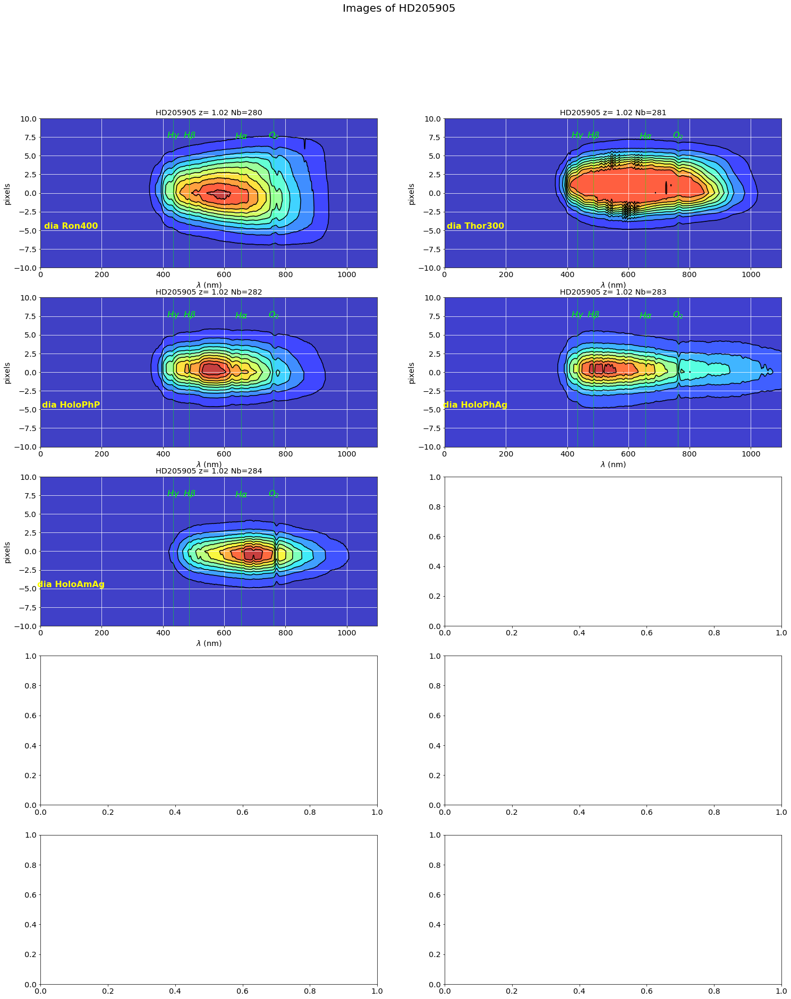

In [32]:
ShowOneOrder_contour(all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour.pdf')

## Test which transverse spectrum

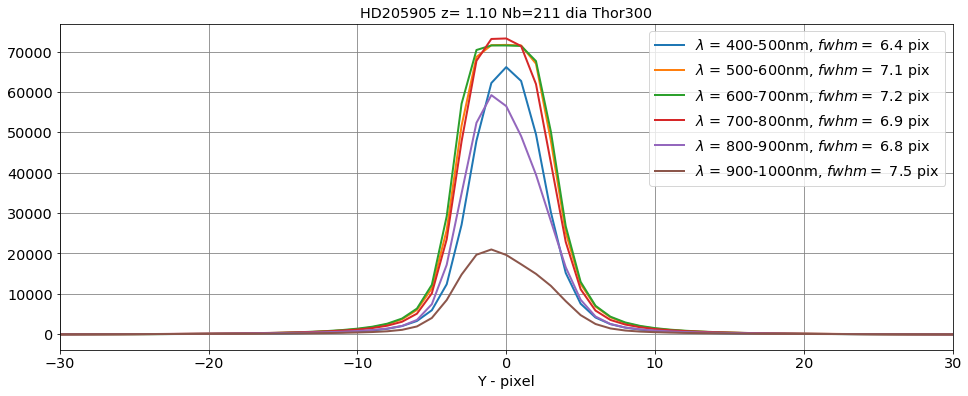

In [33]:
sel=1
w0,fwhm0=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_thor300.pdf')

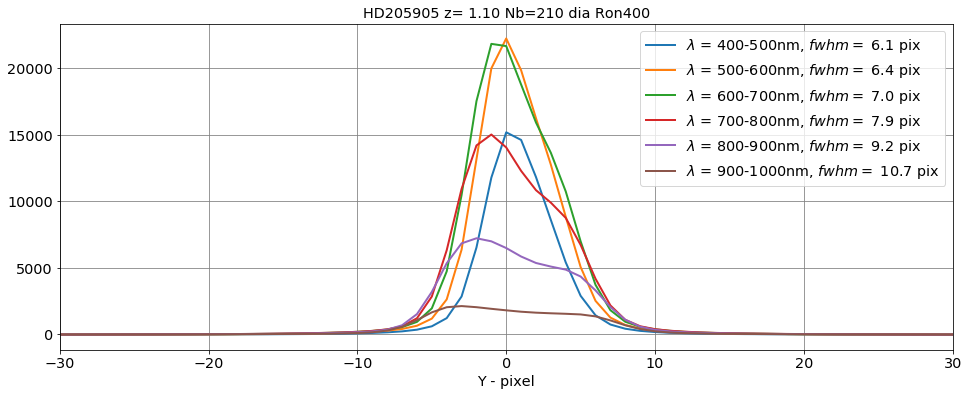

In [71]:
sel=0
w1,fwhm1=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_ron400.pdf')

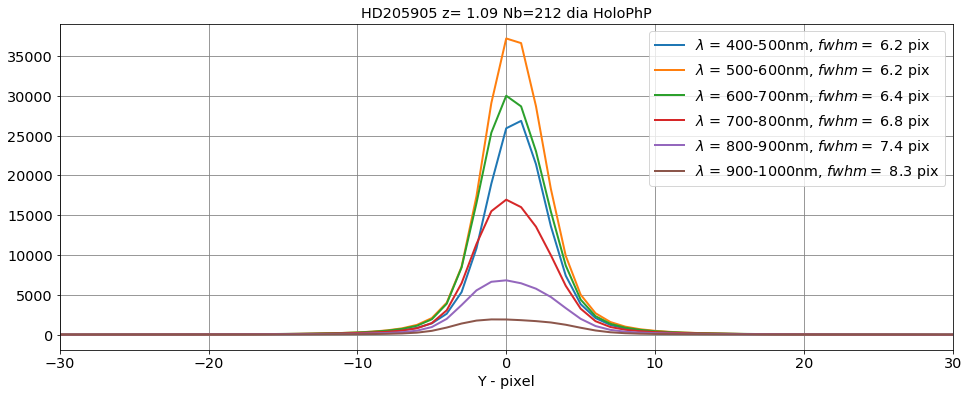

In [72]:
sel=2
w2,fwhm2=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_holophp.pdf')

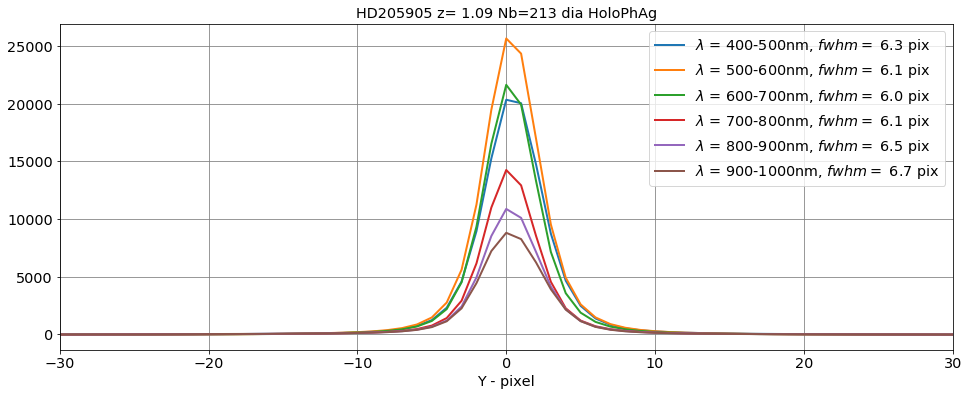

In [73]:
sel=3
w3,fwhm3=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_holophag.pdf')

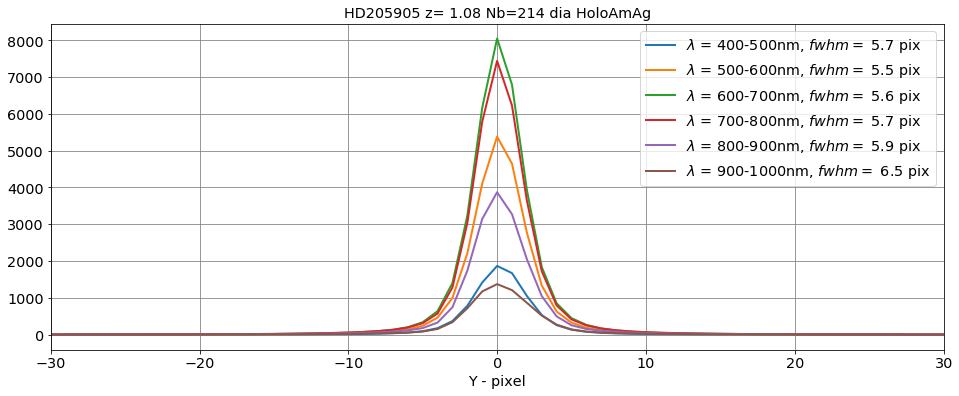

In [74]:
sel=4
w4,fwhm4=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_holoamag.pdf')

## Summary on fwhm 

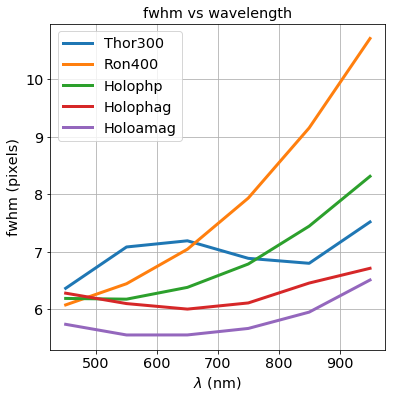

In [75]:
plt.figure(figsize=(6,6))
NBINS=w0.shape[0]
plt.plot(w0,fwhm0,'-',label='Thor300',lw=3)
plt.plot(w1,fwhm1,'-',label='Ron400',lw=3)
plt.plot(w2,fwhm2,'-',label='Holophp',lw=3)
plt.plot(w3,fwhm3,'-',label='Holophag',lw=3)
plt.plot(w4,fwhm4,'-',label='Holoamag',lw=3)
plt.grid()
plt.xlabel('$\lambda$ (nm)')
plt.ylabel('fwhm (pixels)')
plt.title('fwhm vs wavelength')
plt.legend(loc=2)
figname='fwhm_vs_lambdas_{}.pdf'.format(NBINS)
figfilename=os.path.join(dir_top_images,figname)  
#plt.ylim(0.,25.)
plt.savefig(figfilename)

## Longitudinal spectrum versus transverse width

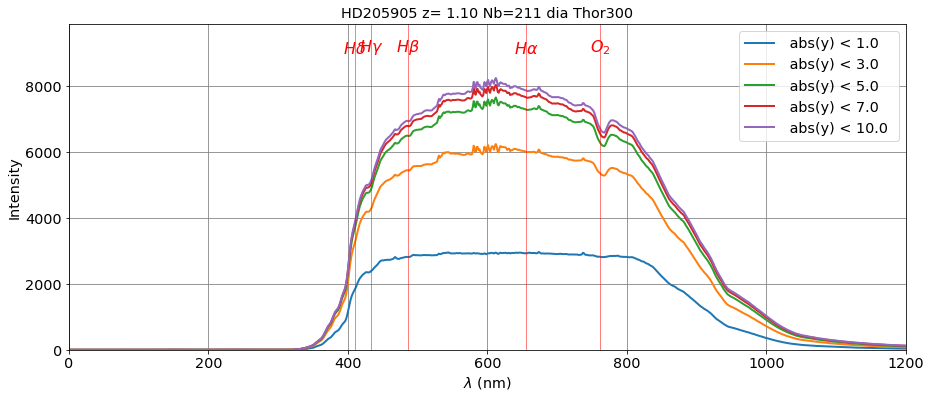

In [76]:
sel=1
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_thor300_1.pdf')

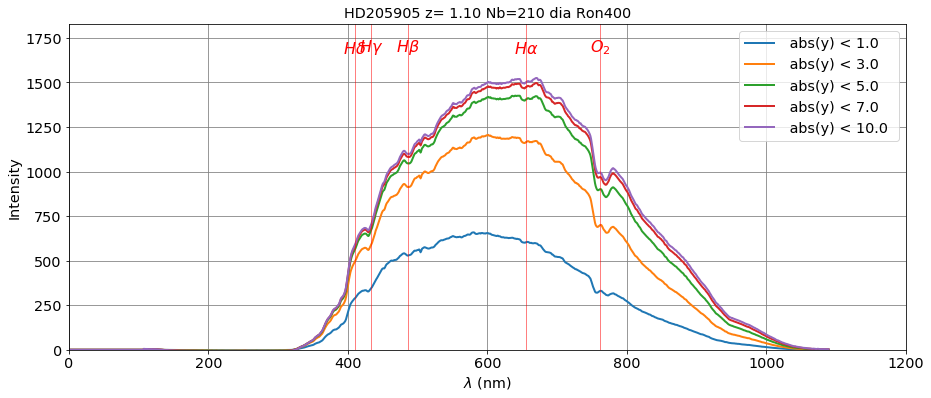

In [77]:
sel=0
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_ron400_1.pdf')

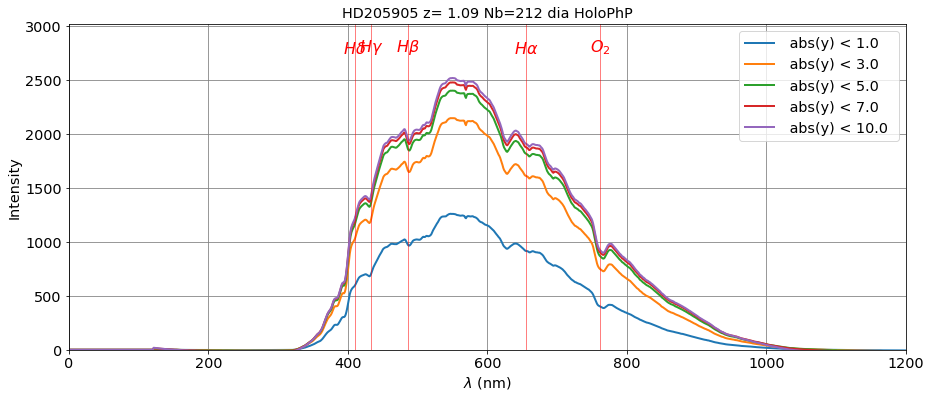

In [79]:
sel=2
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_holophp_1.pdf')

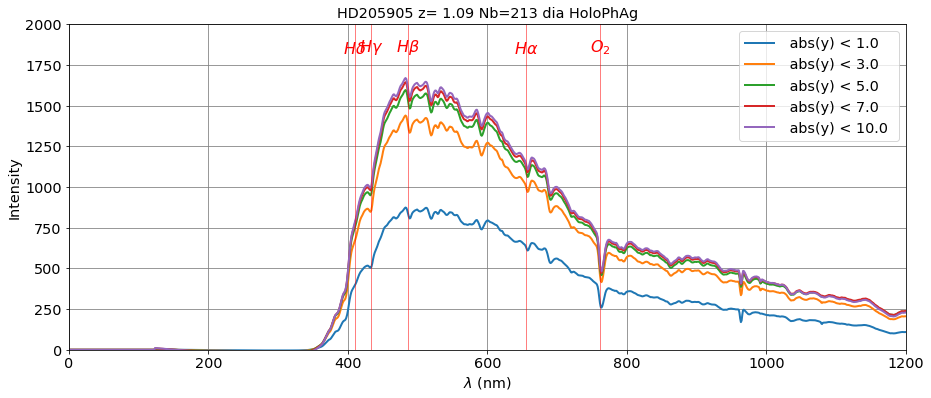

In [81]:
sel=3
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_holophag_1.pdf')

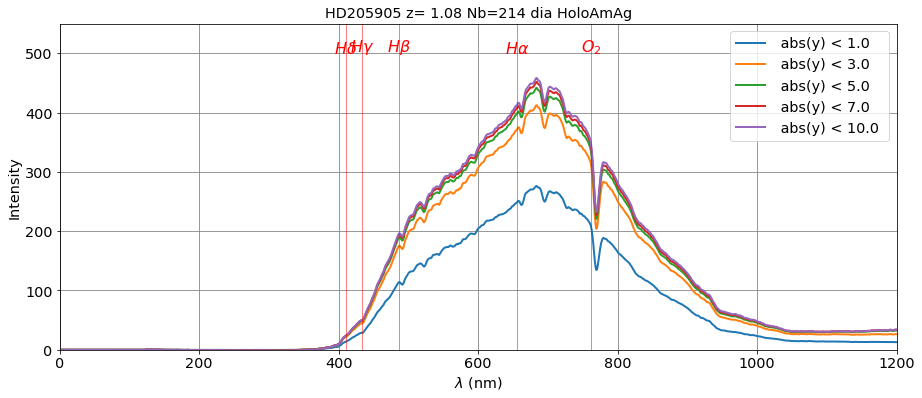

In [82]:
sel=4
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_holoamag_1.pdf')

## Quality of O2

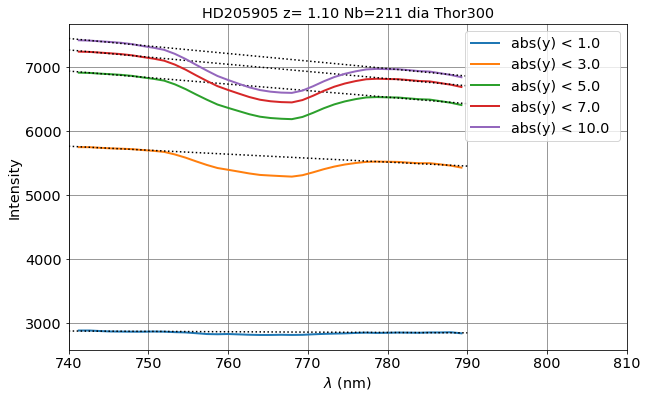

In [83]:
sel=1
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_thor300.pdf')

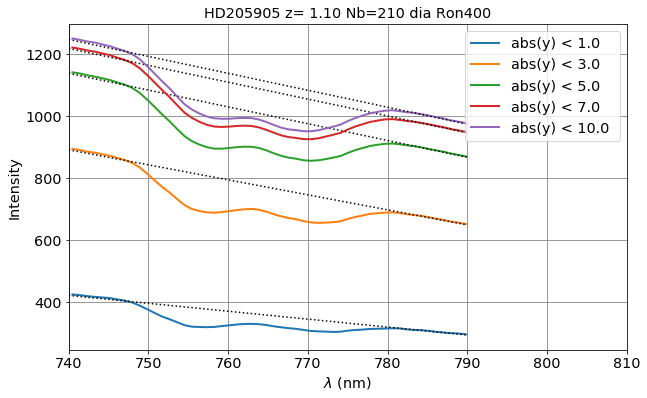

In [84]:
sel=0
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holophp.pdf')

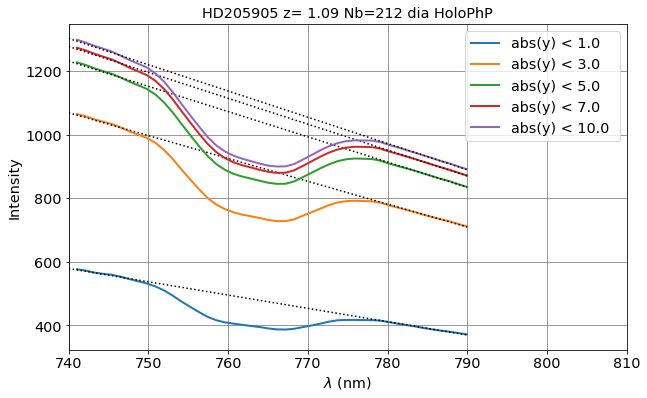

In [85]:
sel=2
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holophag.pdf')

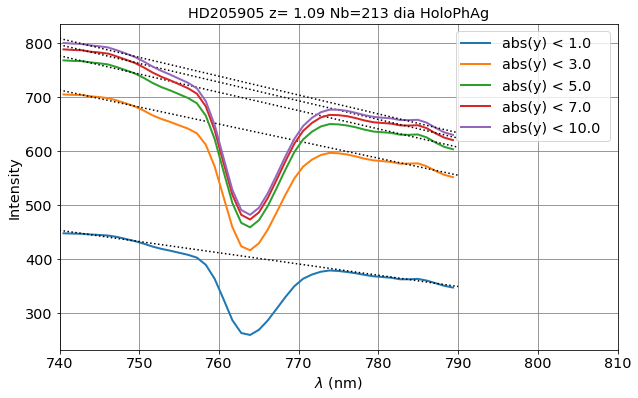

In [87]:
sel=3
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holophag.pdf')

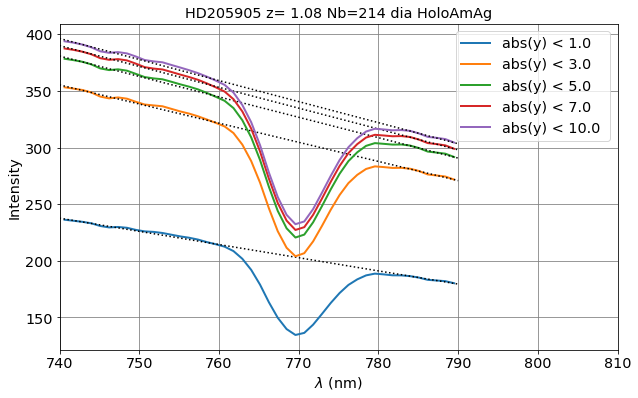

In [88]:
sel=4
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holoamag.pdf')

# Equivalent width

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


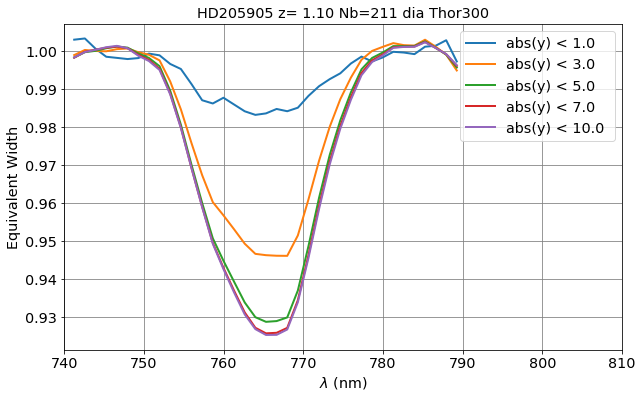

In [89]:
sel=1
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_thor300_1.pdf')

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


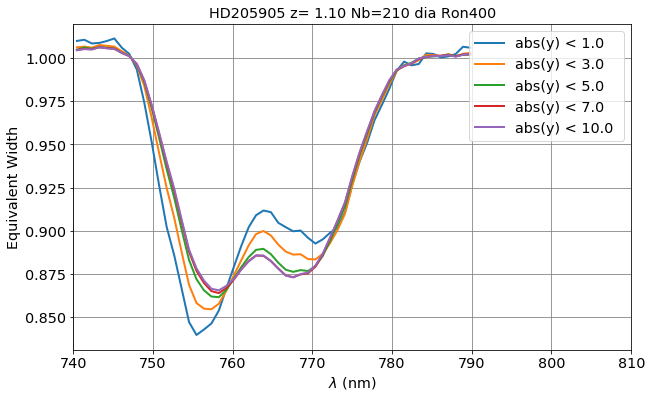

In [91]:
sel=0
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_ron400_1.pdf')

Load hologram HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.0 degrees
Hologram center at x0 = 856.0 and y0 = 562.3 with average tilt of -1.0 degrees
Order  0 position at x0 = 590.7 and y0 = 567.2
Order +1 position at x0 = 1121.3 and y0 = 557.5
Distance between the orders: 530.76 pixels (12.74 mm)


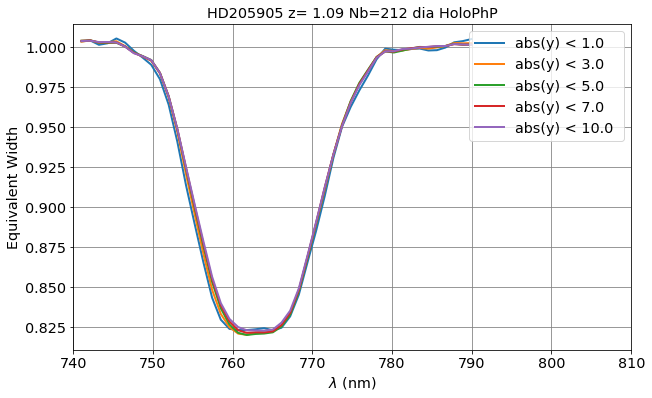

In [92]:
sel=2
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_holophp.pdf')

Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)


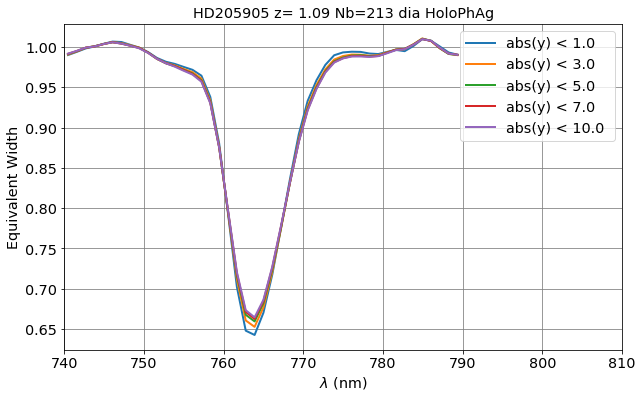

In [94]:
sel=3
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_holophag.pdf')

Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)


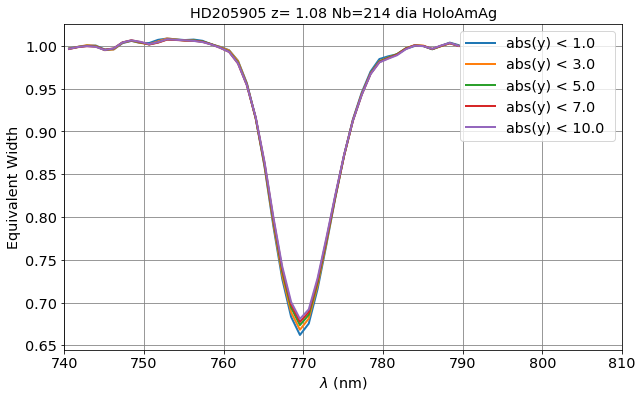

In [95]:
sel=4
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_holoamag.pdf')

# Compute equivalent width and show absorption line

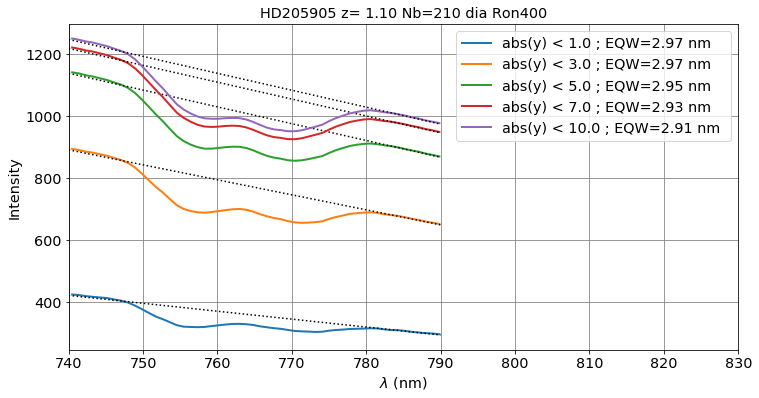

In [54]:
sel=1
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_thor300_1.pdf')

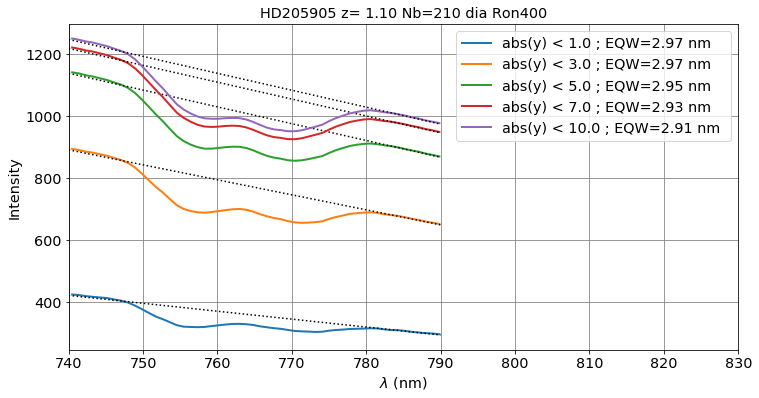

In [97]:
sel=0
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_ron400_1.pdf')

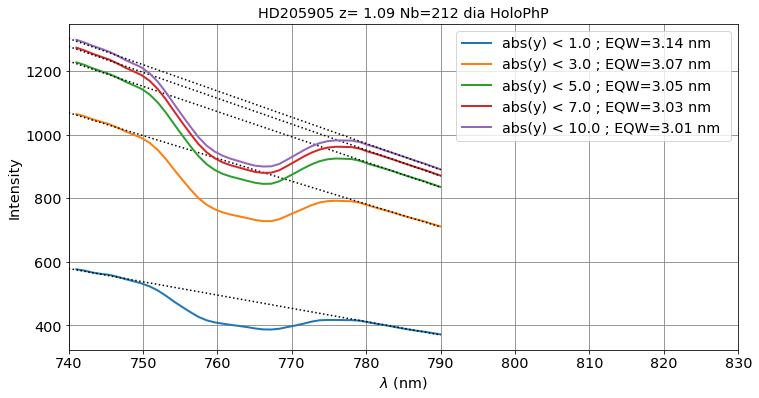

In [96]:
sel=2
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_php_1.pdf')

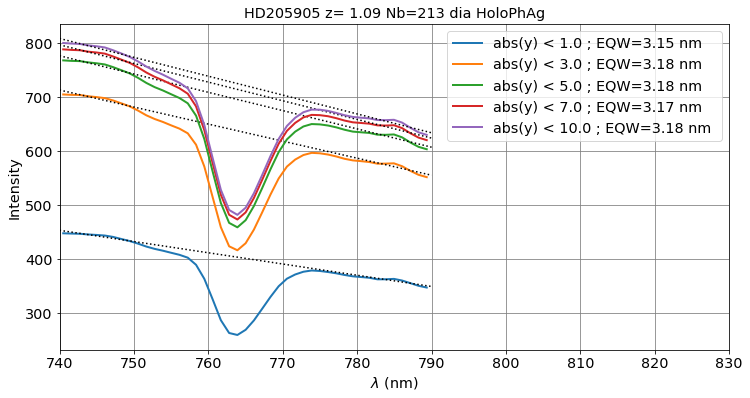

In [98]:
sel=3
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_phag_1.pdf')

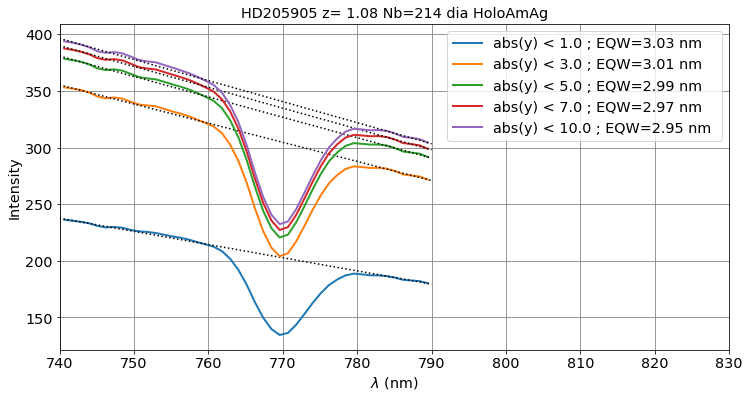

In [99]:
sel=4
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_amag_1.pdf')

# Computation of equivalent width and show equivalent width

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


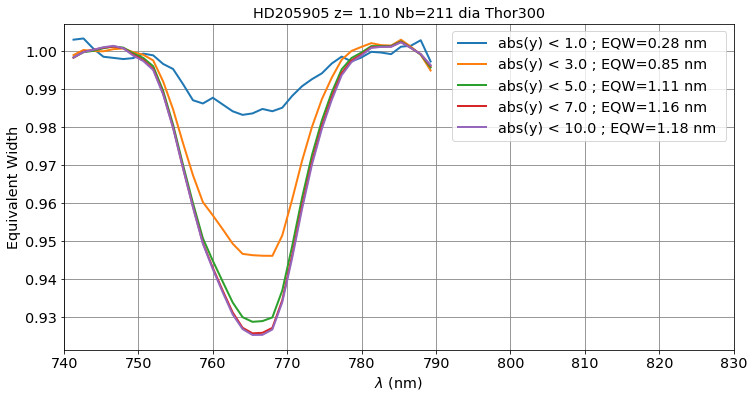

In [100]:
sel=1
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_thor300_1.pdf')

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


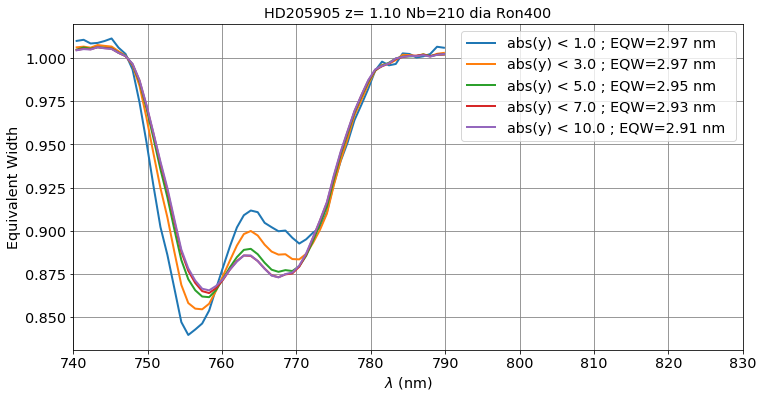

In [101]:
sel=0
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_ron400_1.pdf')

Load hologram HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.0 degrees
Hologram center at x0 = 856.0 and y0 = 562.3 with average tilt of -1.0 degrees
Order  0 position at x0 = 590.7 and y0 = 567.2
Order +1 position at x0 = 1121.3 and y0 = 557.5
Distance between the orders: 530.76 pixels (12.74 mm)


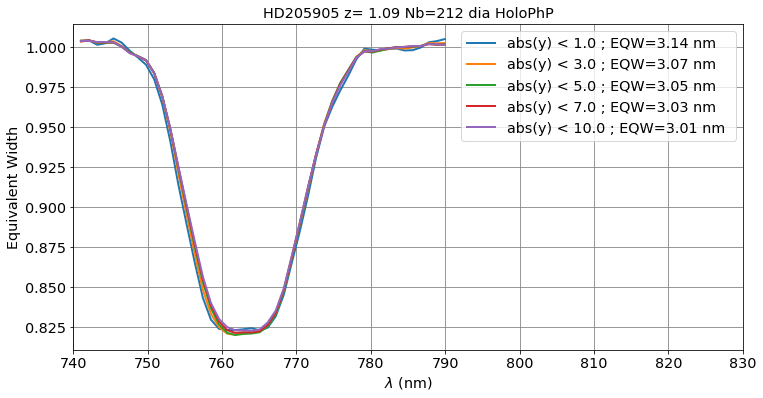

In [102]:
sel=2
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_holophp_1.pdf')

Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)


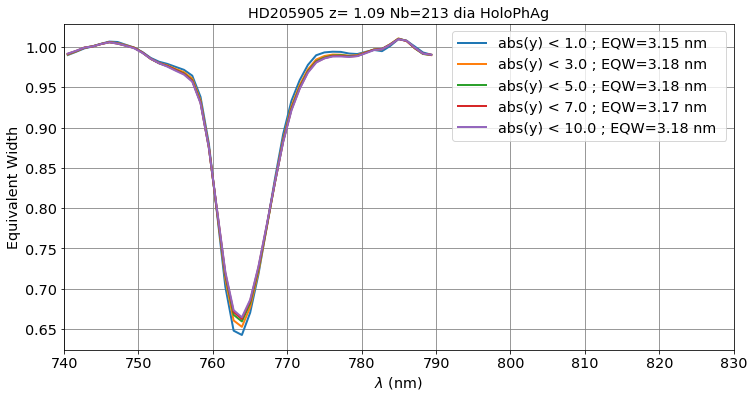

In [103]:
sel=3
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_holophag_1.pdf')

Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)


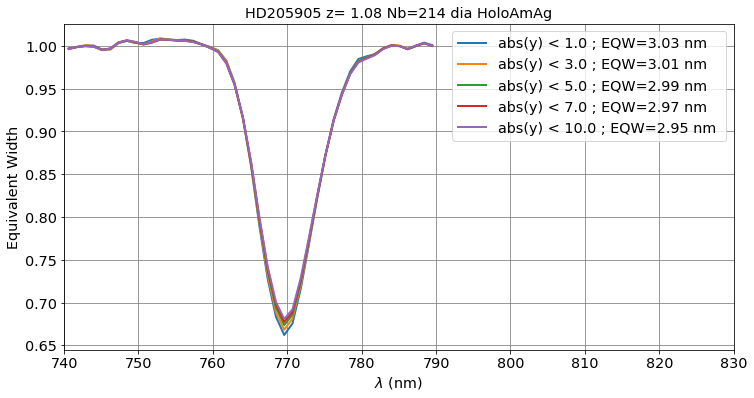

In [104]:
sel=4
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_holoamag_1.pdf')